## EXPLORATORY DATA ANALYSIS

##### Objective:

The main goal of this assignment is to conduct a thorough exploratory analysis of the "cardiographic.csv" dataset to uncover insights, identify patterns, and understand the dataset's underlying structure. 
You will use statistical summaries, visualizations, and data manipulation techniques to explore the dataset comprehensively.

In [1]:
# Load libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings   
warnings.filterwarnings('ignore')

%matplotlib inline

plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 300

#### DATA HANDLING

In [2]:
# Reading the file 'Cardiotocographic.csv'

cardio_df = pd.read_csv('Cardiotocographic.csv')
cardio_df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [3]:
cardio_df.dtypes

LB          float64
AC          float64
FM          float64
UC          float64
DL          float64
DS          float64
DP          float64
ASTV        float64
MSTV        float64
ALTV        float64
MLTV        float64
Width       float64
Tendency    float64
NSP         float64
dtype: object

In [4]:
cardio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [5]:
# Check for Duplicates

if(cardio_df.duplicated().sum() != 0):
    print("DUPLICATES ARE PRESENT")
    print("No.of duplicated rows: ",cardio_df.duplicated().sum())
else:
    print("NO DUPLICATES")

# Print duplicated values
cardio_df[cardio_df.duplicated(keep = False)]

DUPLICATES ARE PRESENT
No.of duplicated rows:  2


,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
1113,122.0,0.000000,0.0,0.000000,0.0,0.0,0.0,19.0,1.9,0.0,15.1,39.0,0.0,1.0
1115,122.0,0.000000,0.0,0.000000,0.0,0.0,0.0,19.0,1.9,0.0,15.1,39.0,0.0,1.0
1457,148.0,0.004717,0.0,0.002358,0.0,0.0,0.0,40.0,0.9,0.0,10.6,35.0,0.0,1.0
1458,148.0,0.004717,0.0,0.002358,0.0,0.0,0.0,40.0,0.9,0.0,10.6,35.0,0.0,1.0


In [6]:
# Remove Duplicates

cardio_df.drop_duplicates(inplace = True)
cardio_df.shape

print("No.of duplicated rows: ",cardio_df.duplicated().sum())

No.of duplicated rows:  0


##### MISSING VALUE IMPUTATION

In [7]:
cardio_df.isna()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2122,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2123,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2124,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [8]:
cardio_df.isna().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

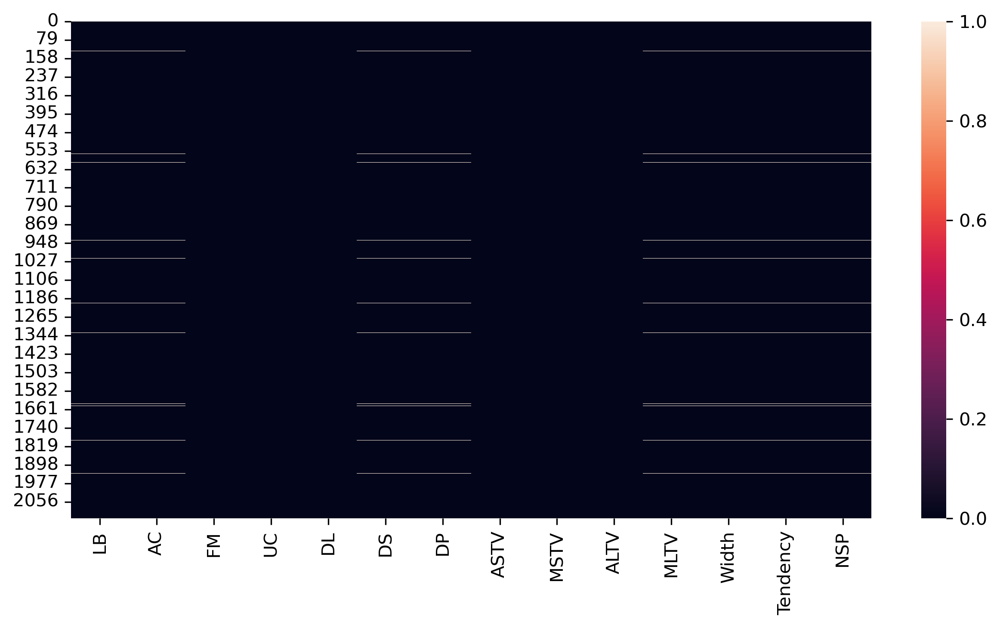

In [9]:
# Visualizing missing values
sns.heatmap(cardio_df.isna())
plt.show()

In [10]:
# % of missing values

for i in cardio_df.isna().sum():
    print((i/len(cardio_df))*100)


# 0 to 5 % missing values: drop rows
# 6 to 45 %: replace the missing values
# 50%: drop column

0.9887005649717515
0.9416195856873822
0.0
0.0
0.0
0.9887005649717515
0.9887005649717515
0.0
0.0
0.0
0.9887005649717515
0.9887005649717515
0.9887005649717515
0.9887005649717515


In [11]:
cardio_df.dropna(inplace = True)
cardio_df.isna().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

### DESCRIPTIVE STATISTICS - OUTLIER DETECTION

In [12]:
cardio_df.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000
mean,133.342023,0.003203,0.009973,0.004391,0.001894,0.000003,0.000175,47.013569,1.360968,10.363493,8.280546,70.461052,0.316672,1.304797
std,11.268266,0.004325,0.067902,0.003350,0.003349,0.000142,0.000840,18.846186,1.173620,21.289827,7.774969,42.939806,0.645855,0.644857
min,51.842487,-0.019284,-0.480634,-0.014925,-0.015393,-0.001353,-0.005348,-63.000000,-6.600000,-91.000000,-50.700000,-174.000000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001838,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001631,0.000000,0.004484,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.400000,67.486468,0.000000,1.000000
75%,140.000000,0.005650,0.002559,0.006543,0.003295,0.000000,0.000000,61.000000,1.700000,11.000000,10.900000,100.000000,1.000000,1.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.002706,0.010695,162.000000,13.800000,182.000000,101.400000,357.000000,3.000000,5.000000


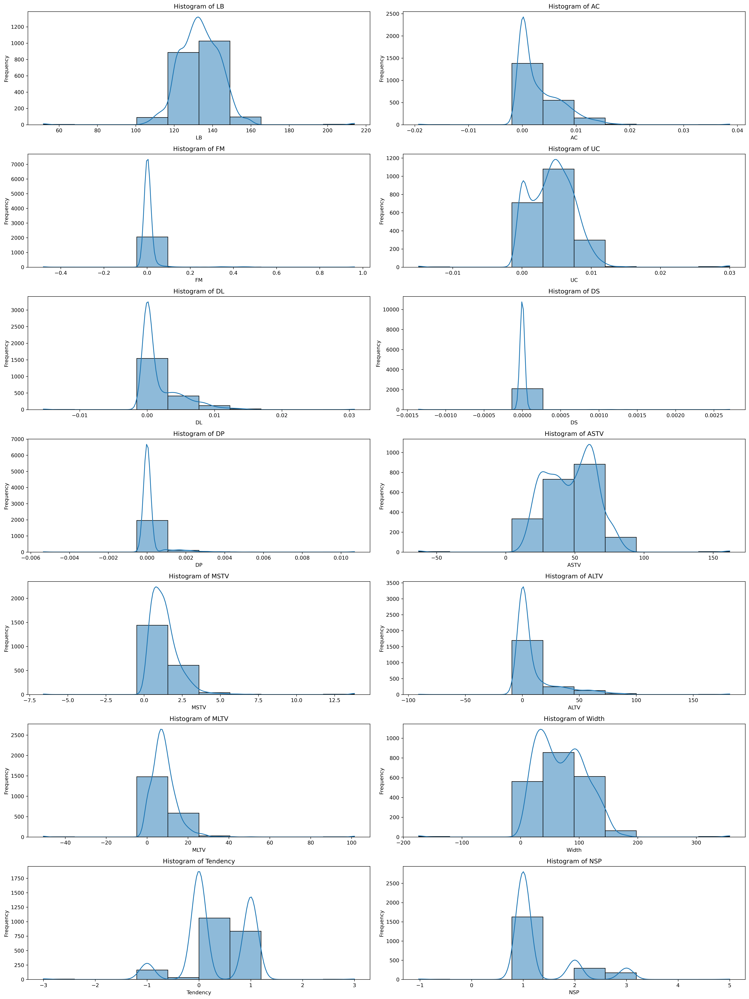

In [13]:
# HISTOGRAM
plt.figure(figsize = (20,30))
for i, column in enumerate( cardio_df,1):
    plt.subplot(8,2,i)
    sns.histplot(cardio_df[column], bins = 10, kde = True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


# Skewness: Less than -1 or greater than +1 high skewness
# -0.5 to +0.5: Moderate skewness
# 0: Normal

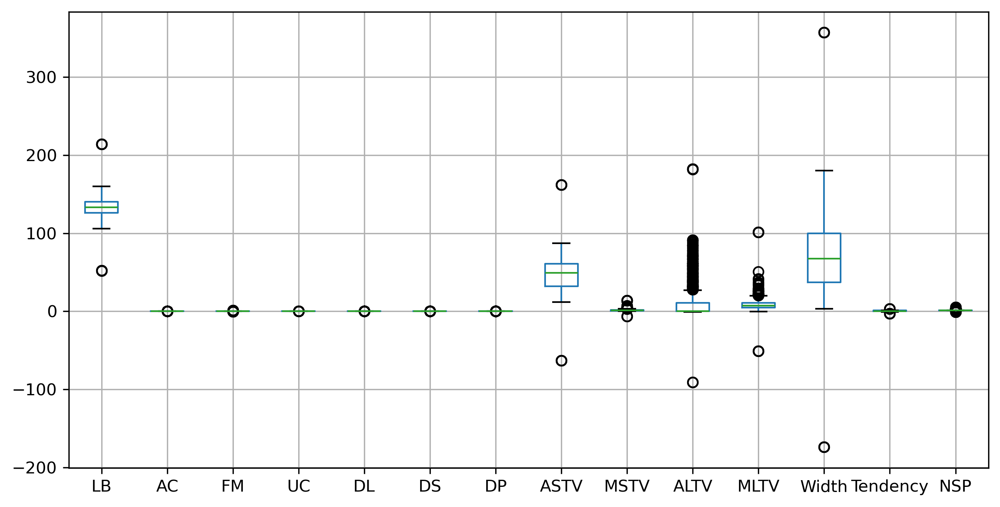

In [14]:
# BOXPLOT
cardio_df.boxplot()
plt.show()

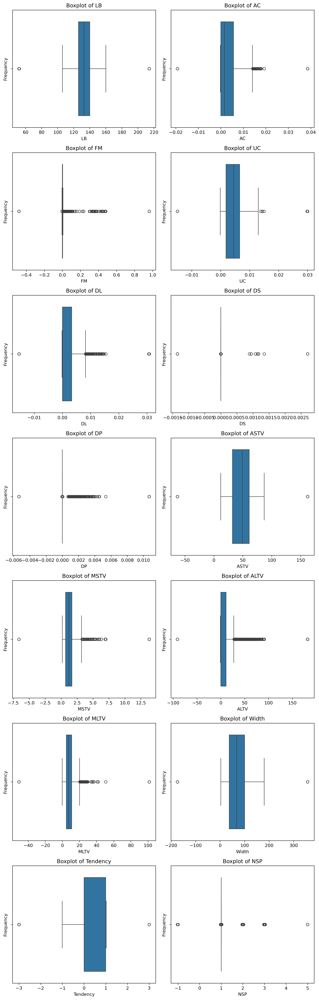

In [15]:
plt.figure(figsize = (10,35))
for i, column in enumerate( cardio_df,1):
    plt.subplot(8,2,i)
    sns.boxplot(x = cardio_df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [16]:
# Outlier Detection

def outlier_detection(data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3 - q1

    upper_extreme = q3 + (1.5 * iqr)
    lower_extreme = q1 - (1.5 * iqr)

    print("upper_extreme = ", upper_extreme)
    print("lower_extreme = ", lower_extreme)
    print("q1 = ", q1)
    print("q3 = ", q3)

In [17]:
# LB
outlier_detection(cardio_df,'LB')

upper_extreme =  161.0
lower_extreme =  105.0
q1 =  126.0
q3 =  140.0


In [18]:
# Capping Outliers 
cardio_df.loc[cardio_df.LB > 161.0, 'LB'] = 161.0
cardio_df.loc[cardio_df.LB < 105.0, 'LB'] = 105.0

In [19]:
# AC
outlier_detection(cardio_df,'AC')

upper_extreme =  0.014124295
lower_extreme =  -0.008474577
q1 =  0.0
q3 =  0.005649718


In [20]:
# Capping Outliers 
cardio_df.loc[cardio_df.AC > 0.014124295, 'AC'] = 0.014124295
cardio_df.loc[cardio_df.AC < -0.008474577, 'AC'] = -0.008474577

In [21]:
# FM
outlier_detection(cardio_df,'FM')

upper_extreme =  0.0063979762499999995
lower_extreme =  -0.00383878575
q1 =  0.0
q3 =  0.0025591905


In [22]:
# Capping Outliers 
cardio_df.loc[cardio_df.FM > 0.0063979762499999995, 'FM'] = 0.0063979762499999995
cardio_df.loc[cardio_df.FM < -0.00383878575, 'FM'] = -0.00383878575

In [23]:
# UC
outlier_detection(cardio_df,'UC')

upper_extreme =  0.013600538
lower_extreme =  -0.005219342000000001
q1 =  0.001838113
q3 =  0.006543083


In [24]:
# Capping Outliers 
cardio_df.loc[cardio_df.UC > 0.013600538, 'UC'] = 0.013600538
cardio_df.loc[cardio_df.UC < -0.005219342000000001, 'UC'] = -0.005219342000000001

In [25]:
# DL
outlier_detection(cardio_df,'DL')

upper_extreme =  0.008237255
lower_extreme =  -0.004942353
q1 =  0.0
q3 =  0.003294902


In [26]:
# Capping Outliers 
cardio_df.loc[cardio_df.DL > 0.008237255, 'DL'] = 0.008237255
cardio_df.loc[cardio_df.DL < -0.004942353, 'DL'] = -0.004942353

In [27]:
# DL
outlier_detection(cardio_df,'DS')

upper_extreme =  0.0
lower_extreme =  0.0
q1 =  0.0
q3 =  0.0


In [28]:
# Capping Outliers 
cardio_df.loc[cardio_df.DS > 0.0, 'DS'] = 0.0
cardio_df.loc[cardio_df.DS < 0.0, 'DS'] = 0.0

In [29]:
# DP
outlier_detection(cardio_df,'DS')

upper_extreme =  0.0
lower_extreme =  0.0
q1 =  0.0
q3 =  0.0


In [30]:
# Capping Outliers 
cardio_df.loc[cardio_df.DP > 0.0, 'DP'] = 0.0
cardio_df.loc[cardio_df.DP < 0.0, 'DP'] = 0.0

In [31]:
# ASTV
outlier_detection(cardio_df,'ASTV')

upper_extreme =  104.5
lower_extreme =  -11.5
q1 =  32.0
q3 =  61.0


In [32]:
# Capping Outliers 
cardio_df.loc[cardio_df.ASTV > 104.5, 'ASTV'] = 104.5
cardio_df.loc[cardio_df.ASTV < -11.5, 'ASTV'] = -11.5

In [33]:
# MSTV
outlier_detection(cardio_df,'MSTV')

upper_extreme =  3.2
lower_extreme =  -0.8
q1 =  0.7
q3 =  1.7


In [34]:
# Capping Outliers 
cardio_df.loc[cardio_df.MSTV > 3.2, 'MSTV'] = 3.2
cardio_df.loc[cardio_df.MSTV < -0.8, 'MSTV'] = -0.8

In [35]:
# ALTV
outlier_detection(cardio_df,'ALTV')

upper_extreme =  27.5
lower_extreme =  -16.5
q1 =  0.0
q3 =  11.0


In [36]:
# Capping Outliers 
cardio_df.loc[cardio_df.ALTV > 27.5, 'ALTV'] = 27.5
cardio_df.loc[cardio_df.ALTV < -16.5, 'ALTV'] = -16.5

In [37]:
# MLTV
outlier_detection(cardio_df,'MLTV')

upper_extreme =  20.35
lower_extreme =  -4.850000000000001
q1 =  4.6
q3 =  10.9


In [38]:
# Capping Outliers 
cardio_df.loc[cardio_df.MLTV > 20.35, 'MLTV'] = 20.35
cardio_df.loc[cardio_df.MLTV < -4.850000000000001, 'MLTV'] = -4.850000000000001

In [39]:
# Tendency
outlier_detection(cardio_df,'Tendency')

upper_extreme =  2.5
lower_extreme =  -1.5
q1 =  0.0
q3 =  1.0


In [40]:
# Capping Outliers 
cardio_df.loc[cardio_df.Tendency > 2.5, 'Tendency'] = 2.5
cardio_df.loc[cardio_df.Tendency < -1.5, 'Tendency'] = -1.5

In [41]:
# Width
outlier_detection(cardio_df,'Width')

upper_extreme =  194.5
lower_extreme =  -57.5
q1 =  37.0
q3 =  100.0


In [42]:
# Capping Outliers 
cardio_df.loc[cardio_df.Width > 194.5, 'Width'] = 194.5
cardio_df.loc[cardio_df.Width < -57.5, 'Width'] = -57.5

In [43]:
# Width
outlier_detection(cardio_df,'NSP')

upper_extreme =  1.0
lower_extreme =  1.0
q1 =  1.0
q3 =  1.0


In [44]:
# Capping Outliers 
cardio_df.loc[cardio_df.NSP > 1.0, 'NSP'] = 1.0
cardio_df.loc[cardio_df.NSP < 1.0, 'NSP'] = 1.0

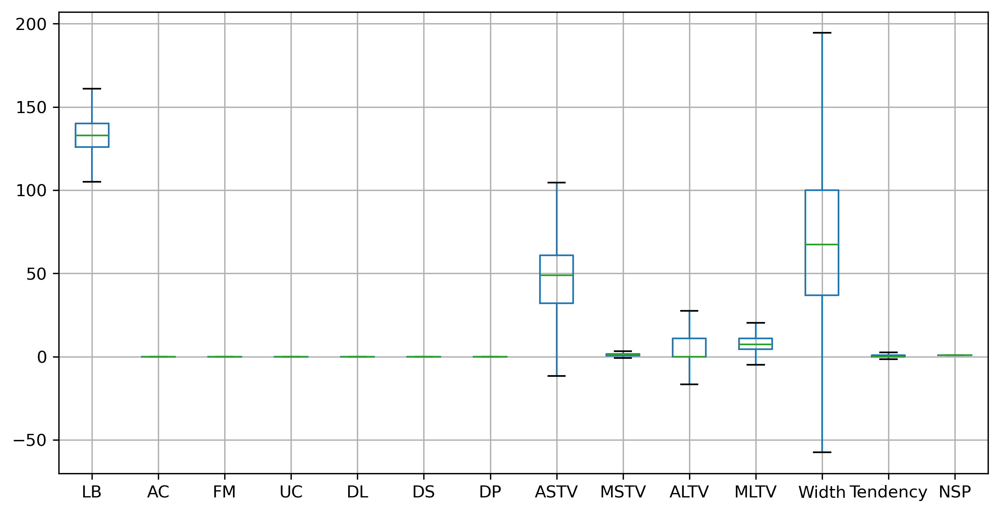

In [45]:
cardio_df.boxplot()
plt.show()

#### SCATTER PLOT & CORRELATION

In [46]:
# relationship between all nemerical columns
sns.pairplot(cardio_df)
plt.show()

In [47]:
# Drop DS and DP columns
cardio_df.drop(columns = ['DS', 'DP'], inplace = True)

In [48]:
# Correlation Coefficient
cardio_df.corr()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
LB,1.000000,-0.081715,-0.006829,-0.163801,-0.156858,0.286501,-0.297040,0.323777,-0.041651,-0.140008,0.281361,NaN
AC,-0.081715,1.000000,0.077516,0.092527,-0.103891,-0.272948,0.216529,-0.410734,-0.151983,0.284221,0.029530,NaN
FM,-0.006829,0.077516,1.000000,-0.317088,-0.019641,0.156314,0.069706,-0.013130,-0.036495,0.165149,0.000690,NaN
UC,-0.163801,0.092527,-0.317088,1.000000,0.270433,-0.217603,0.299700,-0.295354,-0.072767,0.131446,-0.074465,NaN
DL,-0.156858,-0.103891,-0.019641,0.270433,1.000000,-0.113746,0.566593,-0.295959,-0.242170,0.516180,0.014573,NaN
ASTV,0.286501,-0.272948,0.156314,-0.217603,-0.113746,1.000000,-0.434974,0.438939,-0.324869,-0.243003,-0.010316,NaN
MSTV,-0.297040,0.216529,0.069706,0.299700,0.566593,-0.434974,1.000000,-0.541561,0.013248,0.650855,-0.063484,NaN
ALTV,0.323777,-0.410734,-0.013130,-0.295354,-0.295959,0.438939,-0.541561,1.000000,-0.133663,-0.441284,0.050687,NaN
MLTV,-0.041651,-0.151983,-0.036495,-0.072767,-0.242170,-0.324869,0.013248,-0.133663,1.000000,0.074939,0.142676,NaN
Width,-0.140008,0.284221,0.165149,0.131446,0.516180,-0.243003,0.650855,-0.441284,0.074939,1.000000,0.100997,NaN


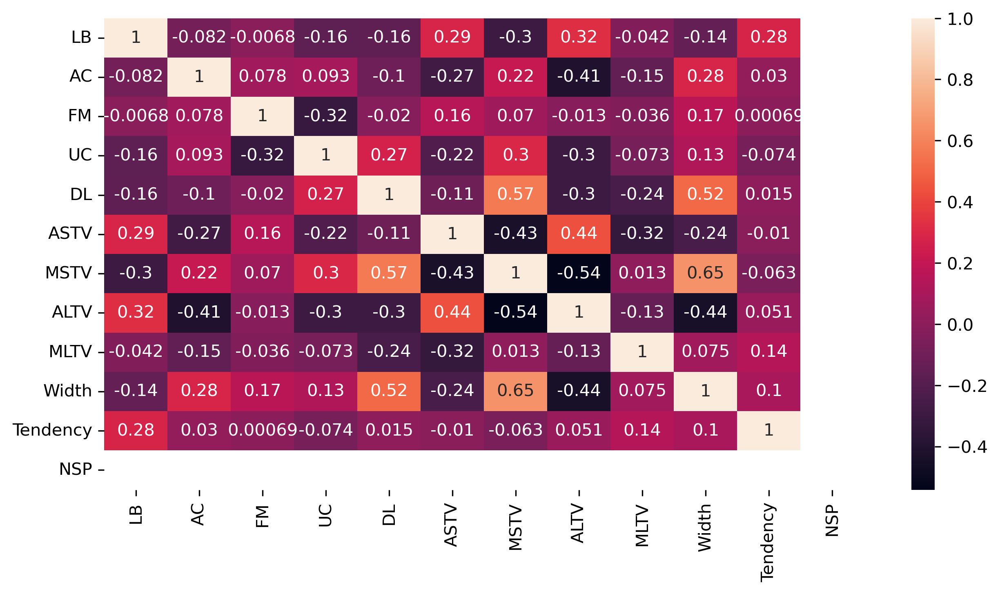

In [49]:
# Plotting in HEATMAP
sns.heatmap(cardio_df.corr(), annot = True)
plt.show()

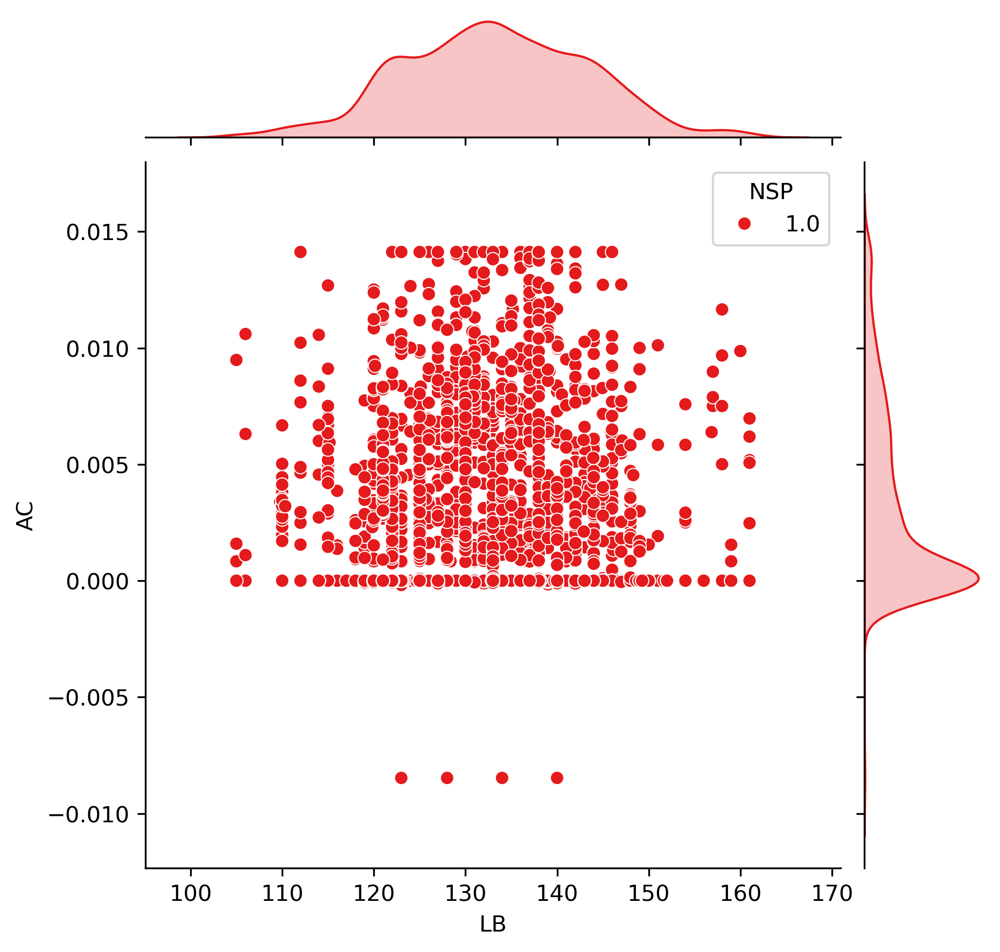

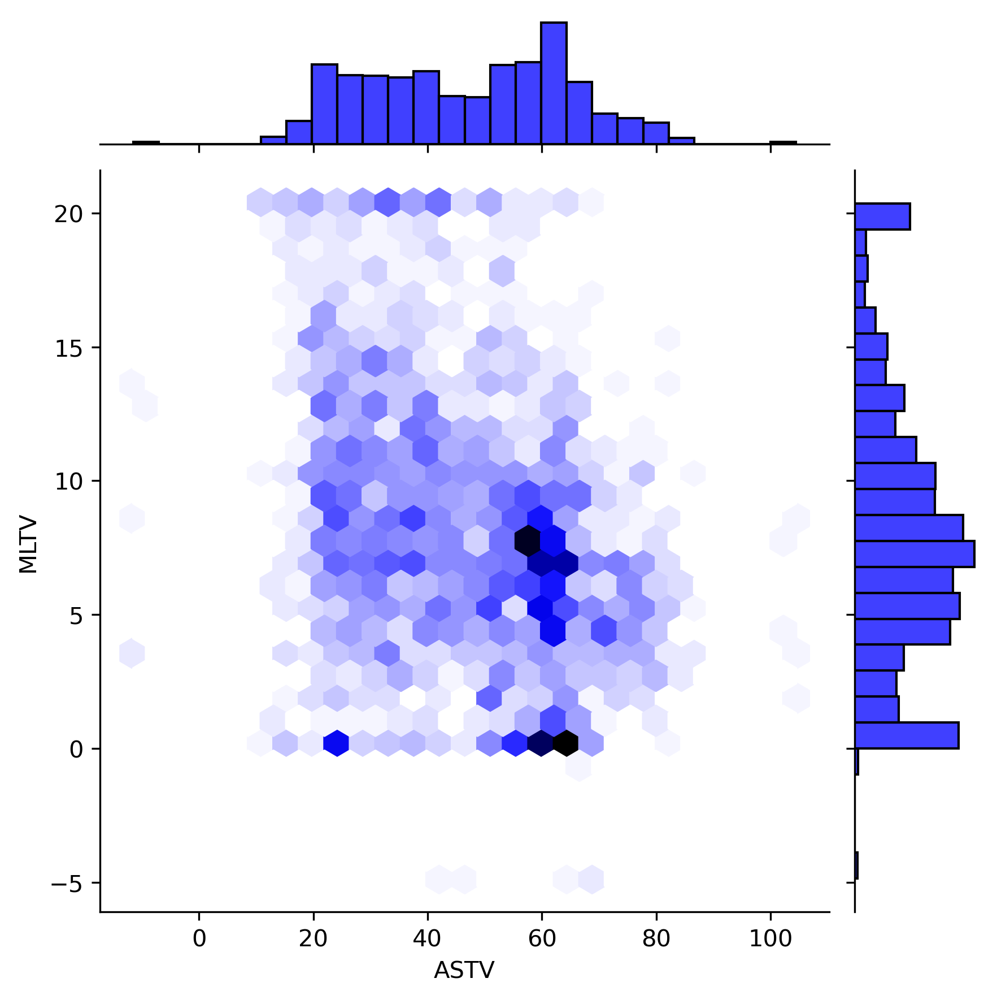

In [50]:
# MULTIVARIATE ANALYSIS

# Jointplot to examine relationships between key variables
sns.jointplot(x = "LB", y = "AC", data = cardio_df, kind = "scatter", hue = 'NSP', palette = 'Set1')
plt.show()

sns.jointplot(x = "ASTV", y = "MLTV", data = cardio_df, kind = "hex", color = "blue")
plt.show()


###### SCALING OF DATA

In [51]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [52]:
# Standardisation -- Z-score = (x-xbar)/std

sc = StandardScaler()

In [55]:
scaled_data = pd.DataFrame(sc.fit_transform(cardio_df), columns = cardio_df.columns)
scaled_data

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,-1.332647,-0.818008,-0.631707,-1.450225,-0.661947,1.474849,-1.028474,1.997180,-1.103010,-0.159736,1.088288,0.0
1,-0.129499,0.841973,-0.631707,0.671045,0.530982,-1.701663,1.023569,-0.647577,0.467779,1.500068,-0.512189,0.0
2,-0.029237,0.046450,-0.631707,1.311479,0.580522,-1.758387,1.023569,-0.647577,1.056825,1.500068,-0.512189,0.0
3,0.071025,-0.151678,-0.631707,1.124021,0.295756,-1.758387,1.408327,-0.647577,2.421448,1.173137,1.088407,0.0
4,-0.134690,0.877119,-0.631707,1.257504,-0.661947,-1.758387,1.408327,-0.647577,2.333091,1.173137,1.088407,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2098,0.672599,-0.818008,1.951573,1.018902,-0.661947,1.815189,-1.413232,1.756747,-0.160537,-0.763301,-0.512189,0.0
2099,0.672599,-0.616457,-0.631707,0.870437,-0.661947,1.758466,-1.156727,1.468228,-0.180172,-0.109439,1.088407,0.0
2100,0.672599,-0.562908,-0.631707,0.831700,-0.661947,1.815189,-1.156727,1.275883,-0.376520,-0.084290,1.088407,0.0
2101,0.672599,-0.641360,-0.631707,0.581399,-0.661947,1.758466,-1.156727,1.949093,-0.199806,-0.109439,1.088407,0.0


In [56]:
scaled_data.describe()

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2.103000e+03,2.103000e+03,2103.000000,2.103000e+03,2.103000e+03,2.103000e+03,2.103000e+03,2.103000e+03,2.103000e+03,2.103000e+03,2.103000e+03,2103.0
mean,-1.229850e-15,-7.433162e-17,0.000000,8.108904e-17,5.405936e-17,9.460388e-17,-5.405936e-17,1.892078e-16,8.108904e-17,1.723142e-16,-1.351484e-17,0.0
std,1.000238e+00,1.000238e+00,1.000238,1.000238e+00,1.000238e+00,1.000238e+00,1.000238e+00,1.000238e+00,1.000238e+00,1.000238e+00,1.000238e+00,0.0
min,-2.836581e+00,-3.023110e+00,-2.181674,-3.185704e+00,-2.510302e+00,-3.318281e+00,-2.695759e+00,-2.234432e+00,-2.526538e+00,-3.215283e+00,-2.913083e+00,0.0
25%,-7.310730e-01,-8.180080e-01,-0.631707,-8.390357e-01,-6.619466e-01,-8.508118e-01,-7.719688e-01,-6.475774e-01,-6.710432e-01,-8.387462e-01,-5.121893e-01,0.0
50%,-2.923690e-02,-3.935350e-01,-0.631707,4.084730e-02,-6.619466e-01,1.134863e-01,-1.307054e-01,-6.475774e-01,-1.212669e-01,-7.205602e-02,-5.121893e-01,0.0
75%,6.725992e-01,6.520599e-01,0.401605,7.254098e-01,5.702906e-01,7.941674e-01,5.105580e-01,4.103255e-01,5.659534e-01,7.456119e-01,1.088407e+00,0.0
max,2.778107e+00,2.857162e+00,1.951573,3.072078e+00,2.418646e+00,3.261636e+00,2.434348e+00,1.997180e+00,2.421448e+00,3.122149e+00,3.489301e+00,0.0


In [57]:
# MinMaxScaler

mn = MinMaxScaler()

In [58]:
minmax_scaled = pd.DataFrame(mn.fit_transform(cardio_df), columns = cardio_df.columns)
minmax_scaled

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,0.267857,0.375000,0.375000,0.277331,0.375000,0.728448,0.325,1.000000,0.287698,0.482143,0.624982,0.0
1,0.482143,0.657297,0.375000,0.616312,0.617025,0.245690,0.725,0.375000,0.605159,0.744048,0.375000,0.0
2,0.500000,0.522010,0.375000,0.718654,0.627076,0.237069,0.725,0.375000,0.724206,0.744048,0.375000,0.0
3,0.517857,0.488316,0.375000,0.688698,0.569302,0.237069,0.800,0.375000,1.000000,0.692460,0.625000,0.0
4,0.481218,0.663274,0.375000,0.710029,0.375000,0.237069,0.800,0.375000,0.982143,0.692460,0.625000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2098,0.625000,0.375000,1.000000,0.671900,0.375000,0.780172,0.250,0.943182,0.478175,0.386905,0.375000,0.0
2099,0.625000,0.409276,0.375000,0.648176,0.375000,0.771552,0.300,0.875000,0.474206,0.490079,0.625000,0.0
2100,0.625000,0.418382,0.375000,0.641985,0.375000,0.780172,0.300,0.829545,0.434524,0.494048,0.625000,0.0
2101,0.625000,0.405041,0.375000,0.601987,0.375000,0.771552,0.300,0.988636,0.470238,0.490079,0.625000,0.0
